# Article visualizations

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import hcp_utils as hcp
from article_helper_functions import *

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


Content:

1) Synthetic data:
    - 1.1) Data visualization
        - Synthetic data generation - appendix
    - 1.2) Experiments
        - Experiment overview (dataframe):
    - 1.3) Results
        - Multiple experiments outputs:
            -  Alpha-scale plot (detection threshold)
        - Single experiment outputs: (example for visualization purposes)
            - MAP partition matrix Z
            - Cluster-link probability matrices for each graph (plot_eta)
    
2) HCP data:
    - 2.1) Data visualization
        - Example of the integer-weighted graphs: use Glasser atlas like in Frontiers paper
    - 2.2) Experiments
        - Experiment overview (dataframe): 5 * 13 = 65 experiments in total (13 unique)
    - 2.3) Results
        -  Multiple experiments outputs:
            - Logprob over iterations with errorbars (convergence plot) - perhaps appendix
            - MAP logprob over initial noc with errorbars
            - Mean pairwise NMI between Z's for different initializations over noc (e.g. mean([NMI(Z1,Z2),NMI(Z1,Z3),NMI(Z2,Z3)]))
        - Single experiment outputs (perhaps the one with highest MAP logprob or NMI):
            - MAP partition matrix Z
            - Brain map (according to Z) - from different views
            - Cluster-link probability matrices for each graph (plot_eta)
            - Circular graph plot: Summary statistics for cluster-link probability over population (both fmri and dmri graphs) and with-in groups (either fmri and dmri): mean, std and KL-div



## 1) Synthetic data

### 1.1) Data visualization
#### Synthetic data generation


In [3]:
GENERATE_NEW_DATA = False
if GENERATE_NEW_DATA:
    S1 = 5 # 5 or 10 (maybe just visualize for S1=5, i.e. not showing class imbalance case)
    S2 = 5 # 5

    for K in [2, 5, 10]:
        for Nc_type in ['balanced', 'unbalanced']:
            for alpha in np.append(np.linspace(0,1,11)[:10],[0.98,1]): #array([0.  , 0.1 , 0.2 , 0.3 , 0.4 , 0.5 , 0.6 , 0.7 , 0.8 , 0.9 , 0.98, 1.])
                A, Zini, Zexp, eta_p1, eta_p2 = generate_syndata(K=K, S1=S1, S2=S2, Nc_type=Nc_type, alpha=alpha, seed=0, save_data=True, disp_data = False, 
                                                label_fontsize=label_fontsize, subtitle_fontsize=subtitle_fontsize, title_fontsize=title_fontsize)
                

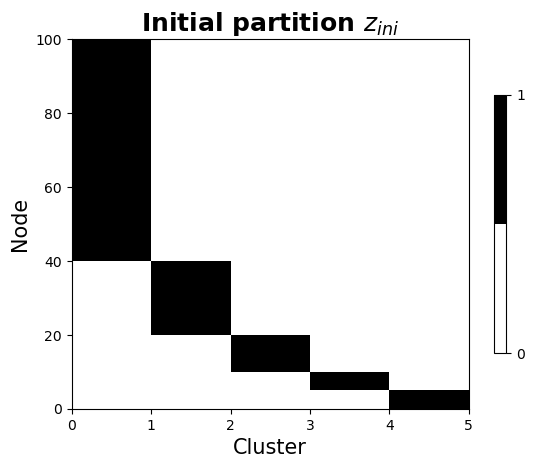

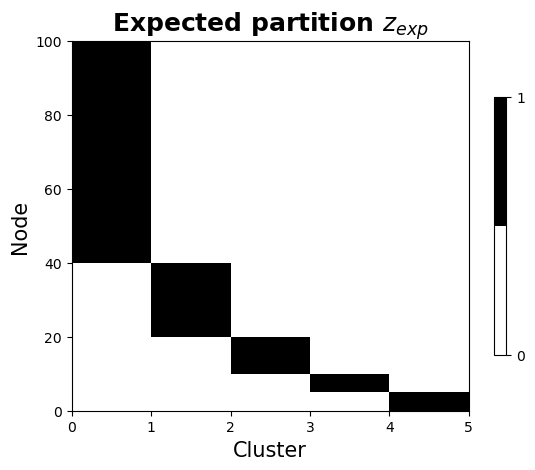

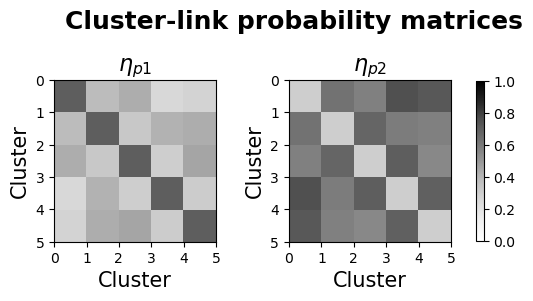

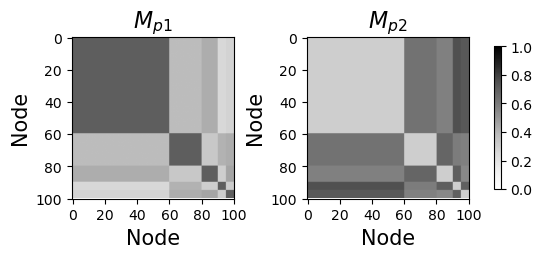

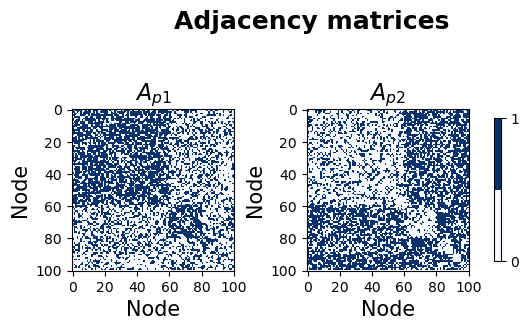

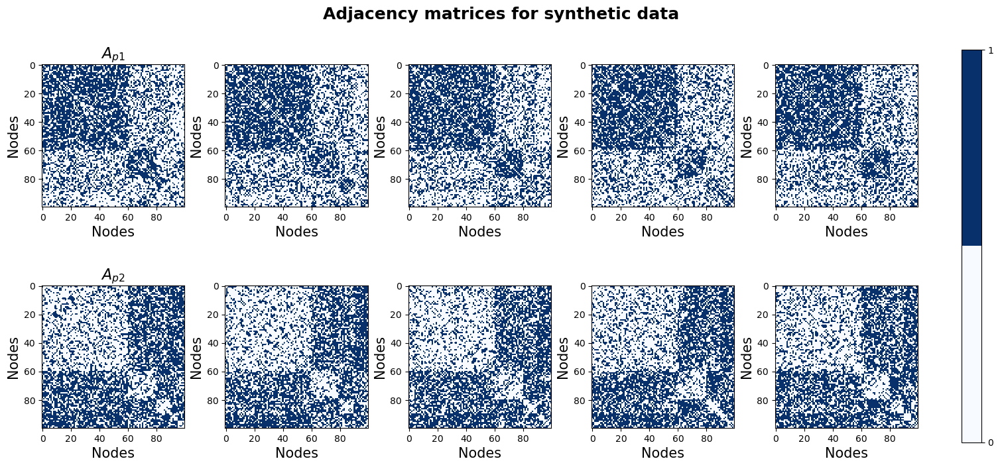

In [4]:
# Example visualization
K = 5
S1 = 5
S2 = 5
Nc_type = 'unbalanced'
alpha = 0.5
A, Zini, Zexp, eta_p1, eta_p2 = generate_syndata(K=K, S1=S1, S2=S2, Nc_type=Nc_type, alpha=alpha, seed=0, save_data=False, disp_data = True, 
                                        label_fontsize=label_fontsize, subtitle_fontsize=subtitle_fontsize, title_fontsize=title_fontsize)

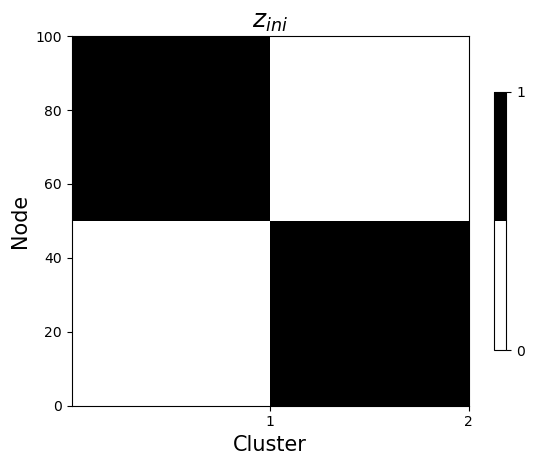

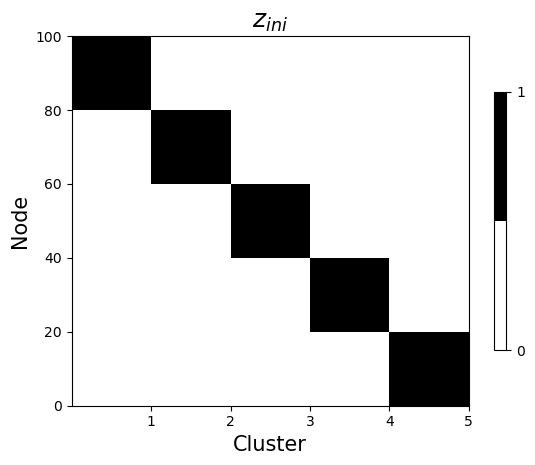

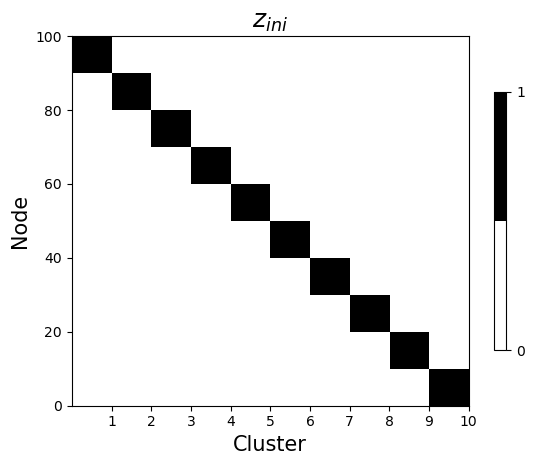

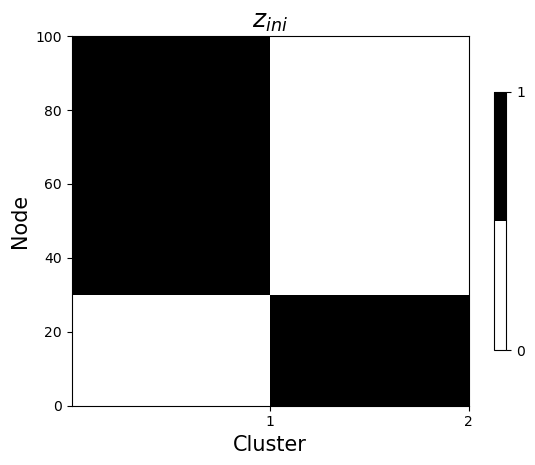

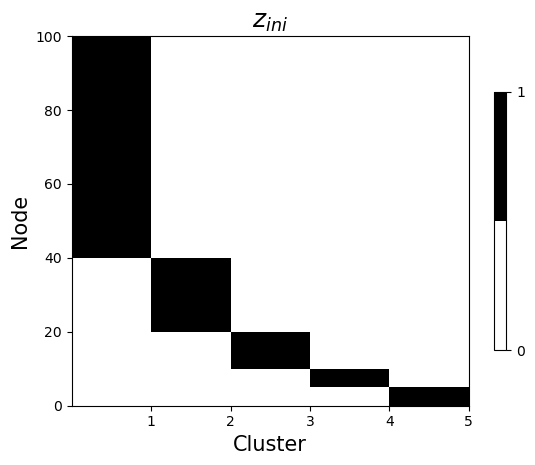

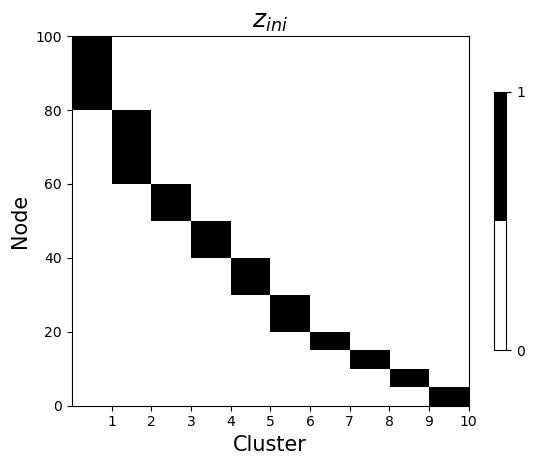

In [6]:
for Nc_type in ['balanced', 'unbalanced']:
    for K in [2,5,10]:
        Zini_filename = 'Zini_'+str(K)+'_'+str(Nc_type)
        Zini = np.load(os.path.join(main_dir,'data','synthetic_article',Zini_filename+'.npy'))

        #x_ticks = range(0, Zexp.shape[1] + 1, 1)
        x_ticks = range(1, Zini.shape[1]+1, 1)
        
        fig, ax = plt.subplots()
        if Zini.shape[1] == 1: #(only one cluster)
            #cmap = ListedColormap(['w'])
            cmap = ListedColormap(['k'])
        else:   
            #cmap = ListedColormap(['k', 'w']) 
            cmap = ListedColormap(['w', 'k']) 
        im = ax.imshow(Zini, interpolation='nearest', aspect='auto', cmap=cmap, extent=(0, Zini.shape[1], 0, Zini.shape[0]))
        ax.set_ylabel('Node', fontsize=label_fontsize)
        ax.set_xlabel('Cluster', fontsize=label_fontsize)
        ax.set_xticks(x_ticks)
        ax.set_title('$z_{ini}$', fontsize=title_fontsize, weight='bold')
        #ax.set_title('Expected partition $Z_{exp}$', fontsize=title_fontsize, weight='bold')
        cbar = fig.colorbar(im, ax=ax, shrink=0.7, ticks=[0,1])
        plt.savefig(os.path.join(main_dir,'figures/article',Zini_filename+'.png'), bbox_inches='tight')

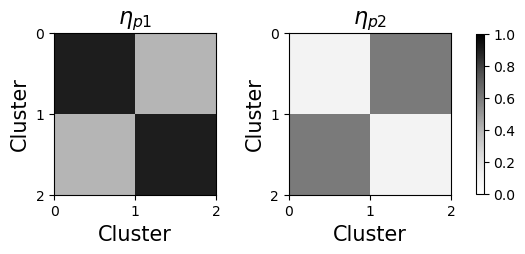

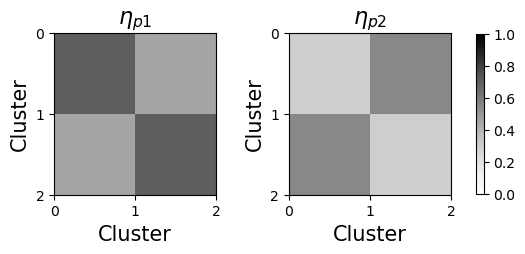

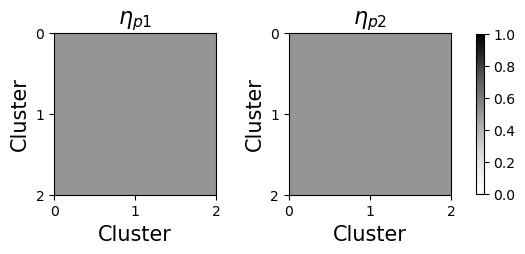

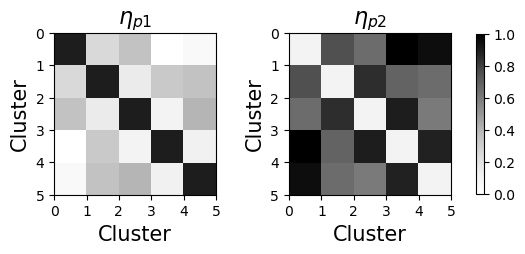

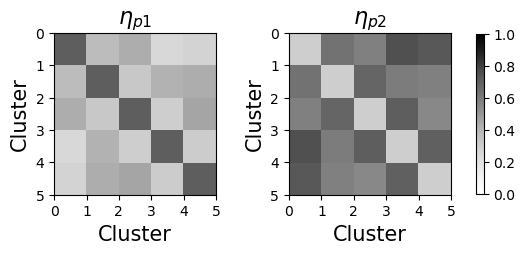

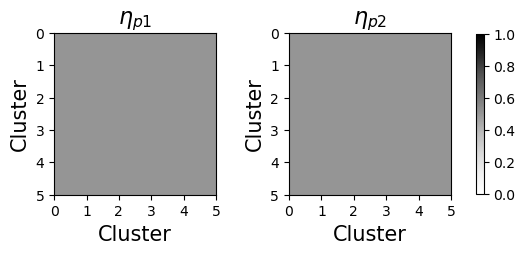

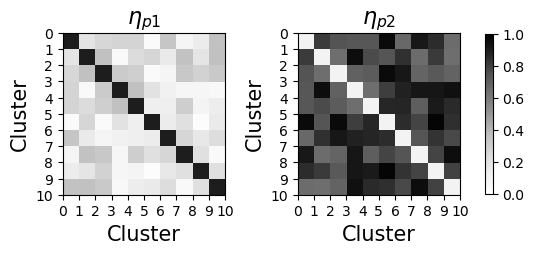

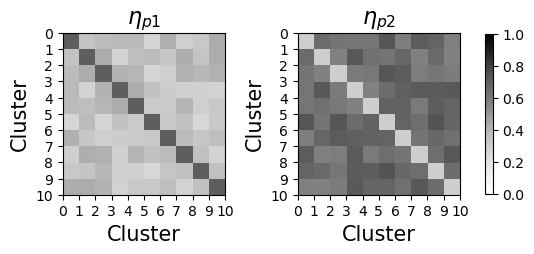

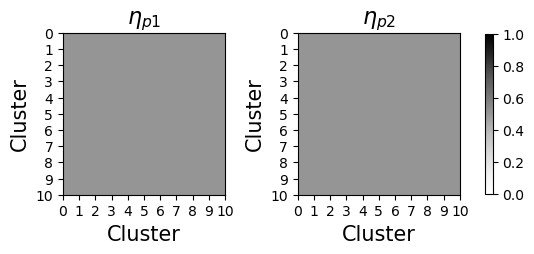

In [7]:
for K in [2,5,10]:
    for alpha in [0, 0.5, 1]:
        eta_filename = str(K)+'_{:.2g}'.format(alpha)

        eta_p1 = np.load(os.path.join(main_dir,'data','synthetic_article','eta_p1_'+eta_filename+'.npy'))
        eta_p2 = np.load(os.path.join(main_dir,'data','synthetic_article','eta_p2_'+eta_filename+'.npy'))
        
        K = eta_p1.shape[0]
        xy_ticks = range(0, K + 1, 1)
                
        cmap = plt.cm.Greys #plt.cm.Greens
        fig, ax = plt.subplots(1,2)
        plt.subplots_adjust(wspace=0.45, top=1.22)
        im = ax[0].imshow(eta_p1, cmap=cmap, extent=[0,K,K,0], vmin=0, vmax=1)
        ax[0].set_ylabel('Cluster', fontsize=label_fontsize)
        ax[0].set_xlabel('Cluster', fontsize=label_fontsize)
        ax[0].set_yticks(xy_ticks)
        ax[0].set_yticklabels(xy_ticks)
        ax[0].set_xticks(xy_ticks)
        ax[0].set_xticklabels(xy_ticks)
        ax[0].set_title('$\eta_{p1}$', fontsize=subtitle_fontsize, weight='bold')
        
        im = ax[1].imshow(eta_p2, cmap=cmap, extent=[0,K,K,0], vmin=0, vmax=1)
        ax[1].set_ylabel('Cluster', fontsize=label_fontsize)
        ax[1].set_xlabel('Cluster', fontsize=label_fontsize)
        ax[1].set_yticks(xy_ticks)
        ax[1].set_yticklabels(xy_ticks)
        ax[1].set_xticks(xy_ticks)
        ax[1].set_xticklabels(xy_ticks)
        ax[1].set_title('$\eta_{p2}$', fontsize=subtitle_fontsize, weight='bold')
        cbar = fig.colorbar(im, ax=ax.ravel().tolist(), shrink=0.3)
        #fig.suptitle('Cluster-link probability matrices',fontsize=title_fontsize, weight='bold')
        plt.savefig(os.path.join(main_dir,'figures/article','eta_'+eta_filename+'_types.png'), bbox_inches='tight')



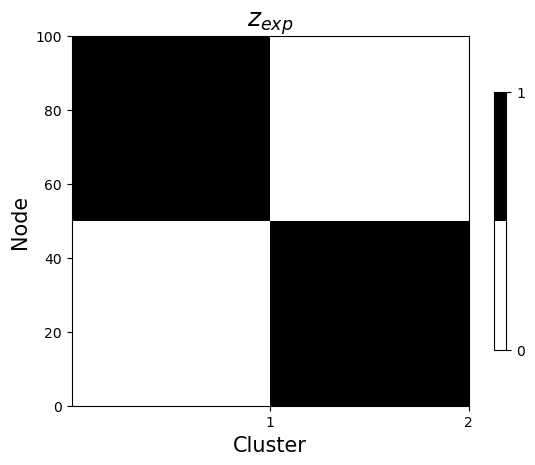

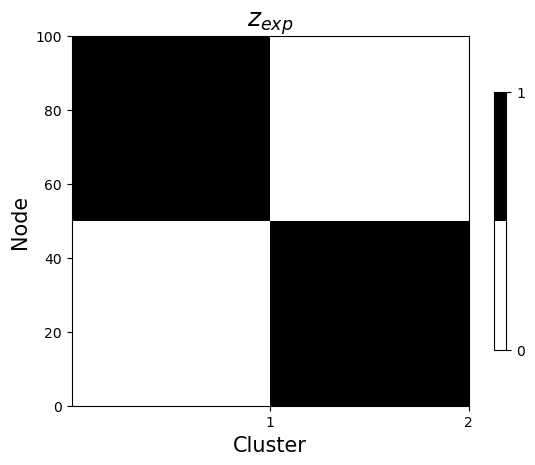

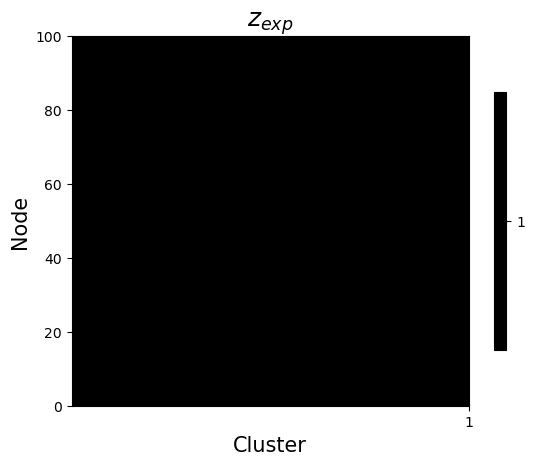

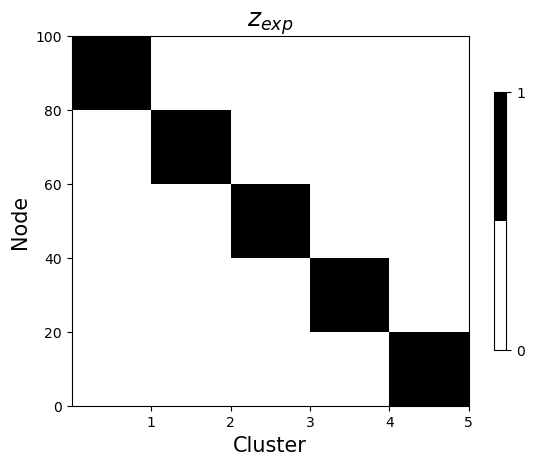

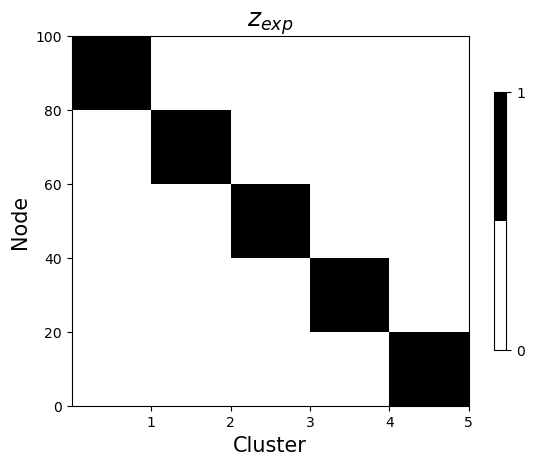

...

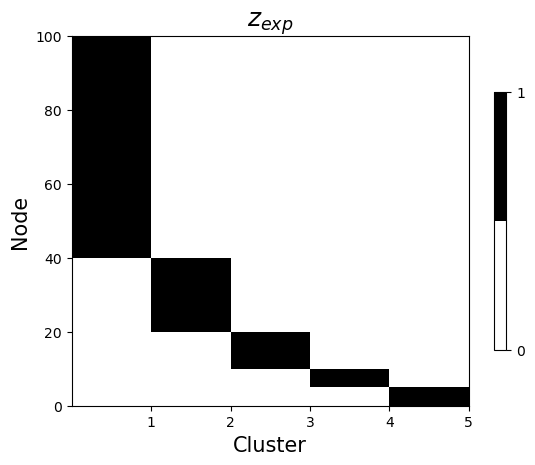

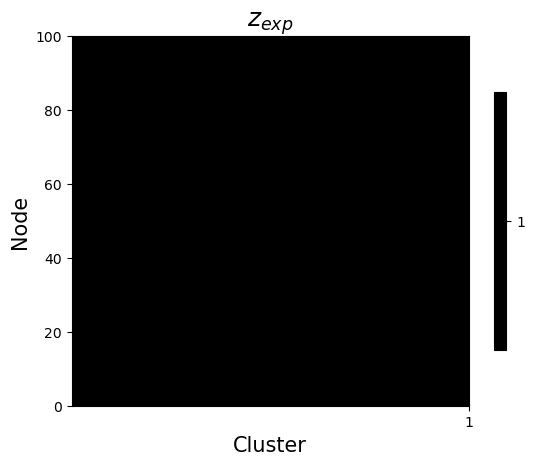

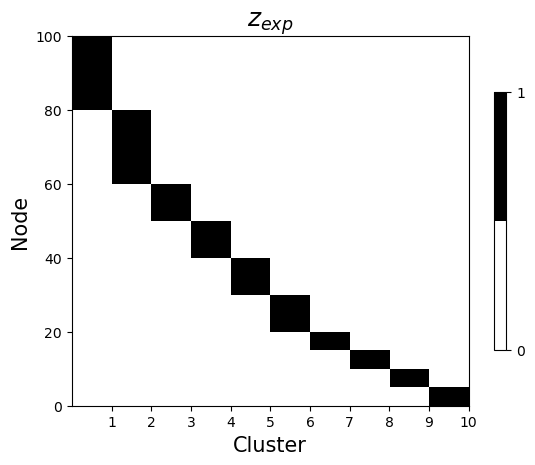

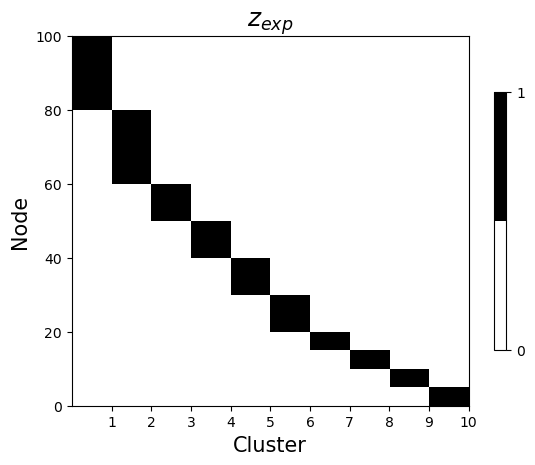

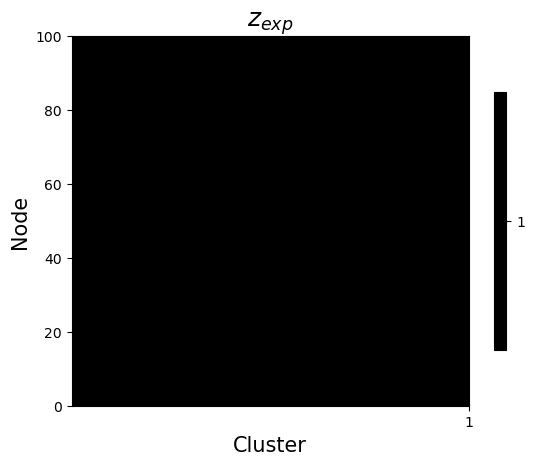

In [8]:
for Nc_type in ['balanced', 'unbalanced']:
    for K in [2,5,10]:
        for alpha in [0, 0.5, 1]:
            Zexp_filename = 'Zexp_'+str(K)+'_'+str(Nc_type)+'_{:.2g}'.format(alpha)
            Zexp = np.load(os.path.join(main_dir,'data','synthetic_article',Zexp_filename+'.npy'))

            #x_ticks = range(0, Zexp.shape[1] + 1, 1)
            x_ticks = range(1, Zexp.shape[1]+1, 1)
            
            fig, ax = plt.subplots()
            if Zexp.shape[1] == 1: #(only one cluster)
                #cmap = ListedColormap(['w'])
                cmap = ListedColormap(['k'])
            else:   
                #cmap = ListedColormap(['k', 'w']) 
                cmap = ListedColormap(['w', 'k']) 
            im = ax.imshow(Zexp, interpolation='nearest', aspect='auto', cmap=cmap, extent=(0, Zexp.shape[1], 0, Zexp.shape[0]))
            ax.set_ylabel('Node', fontsize=label_fontsize)
            ax.set_xlabel('Cluster', fontsize=label_fontsize)
            ax.set_xticks(x_ticks)
            ax.set_title('$z_{exp}$', fontsize=title_fontsize, weight='bold')
            #ax.set_title('Expected partition $Z_{exp}$', fontsize=title_fontsize, weight='bold')
            cbar = fig.colorbar(im, ax=ax, shrink=0.7, ticks=[0,1])
            plt.savefig(os.path.join(main_dir,'figures/article',Zexp_filename+'.png'), bbox_inches='tight')

### 1.2) Experiments
#### Experiment overview (dataframe)


In [9]:
dataset = 'synthetic_article'
top_dir = os.path.join('results', dataset)
main_dir = os.getcwd()
df_exp = get_exp_overview(top_dir)

# sort dataframe
df_sorted = df_exp.sort_values(by=['noc','K','alpha','Nc_type']).reset_index(drop=True)

In [10]:
df_sorted

,dataset,N,K,S1,S2,Nc_type,alpha,model_type,splitmerge,noc,maxiter_gibbs,maxiter_eta0,maxiter_alpha,exp_name_list,n_exp
0,synthetic_article,100,2,5,5,balanced,0.00,parametric,False,10,100,10,100,"[synthetic_article_2023-09-27 22:45:24.142232,...",10
1,synthetic_article,100,2,5,5,unbalanced,0.00,parametric,False,10,100,10,100,"[synthetic_article_2023-09-27 22:45:03.499243,...",10
2,synthetic_article,100,2,5,5,balanced,0.10,parametric,False,10,100,10,100,"[synthetic_article_2023-09-27 20:44:34.553632,...",10
3,synthetic_article,100,2,5,5,unbalanced,0.10,parametric,False,10,100,10,100,"[synthetic_article_2023-09-27 22:44:44.282920,...",10
4,synthetic_article,100,2,5,5,balanced,0.20,parametric,False,10,100,10,100,"[synthetic_article_2023-09-27 20:45:20.877456,...",10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,synthetic_article,100,10,5,5,unbalanced,0.80,parametric,False,10,100,10,100,"[synthetic_article_2023-09-27 22:45:53.664284,...",10
62,synthetic_article,100,10,5,5,balanced,0.90,parametric,False,10,100,10,100,"[synthetic_article_2023-09-27 20:45:33.460659,...",10
63,synthetic_article,100,10,5,5,unbalanced,0.90,parametric,False,10,100,10,100,"[synthetic_article_2023-09-27 22:45:23.971716,...",10
64,synthetic_article,100,10,5,5,balanced,0.98,parametric,False,10,100,10,100,"[synthetic_article_2023-09-27 22:45:54.547078,...",10


In [11]:
# checking that no experiments was run less than 10 times
df_sorted[df_sorted.n_exp<10]

,dataset,N,K,S1,S2,Nc_type,alpha,model_type,splitmerge,noc,maxiter_gibbs,maxiter_eta0,maxiter_alpha,exp_name_list,n_exp


### 1.3) Results

##### Alpha-scale plot (Detection threshold)

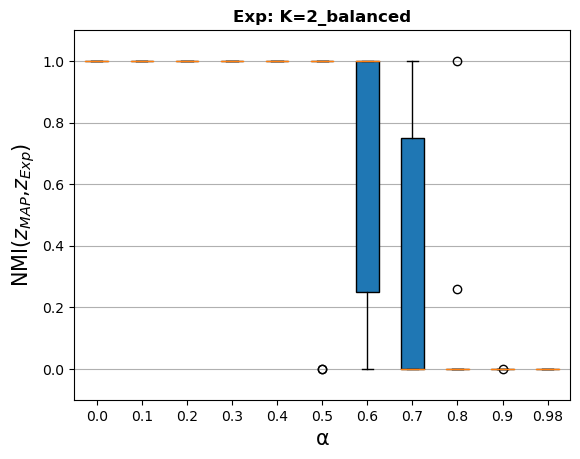

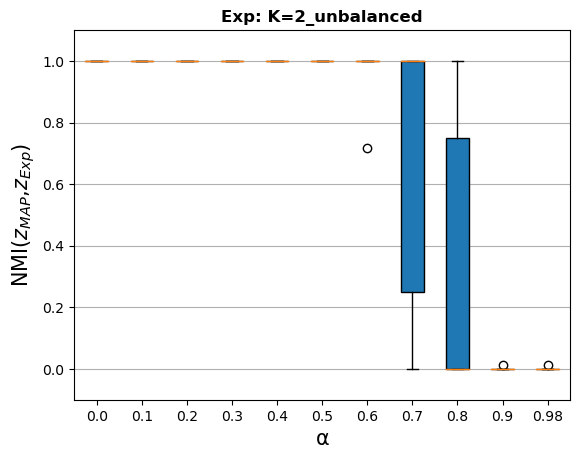

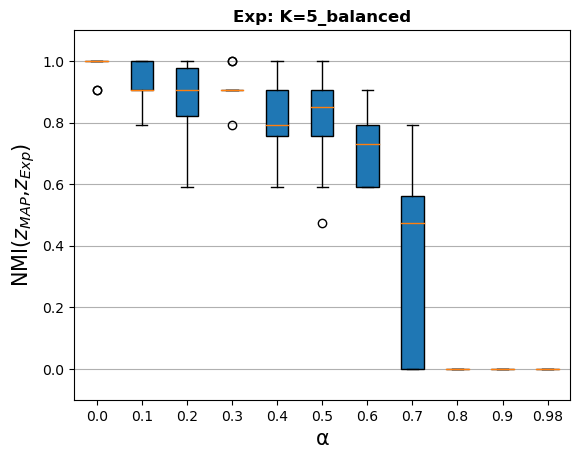

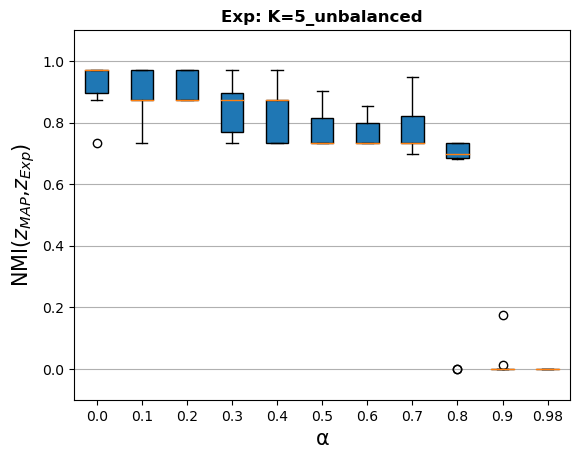

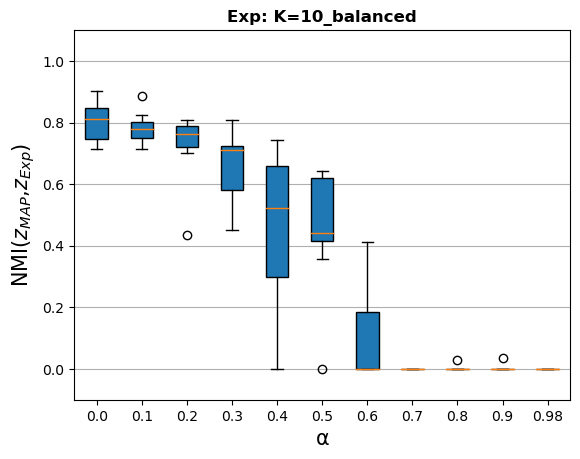

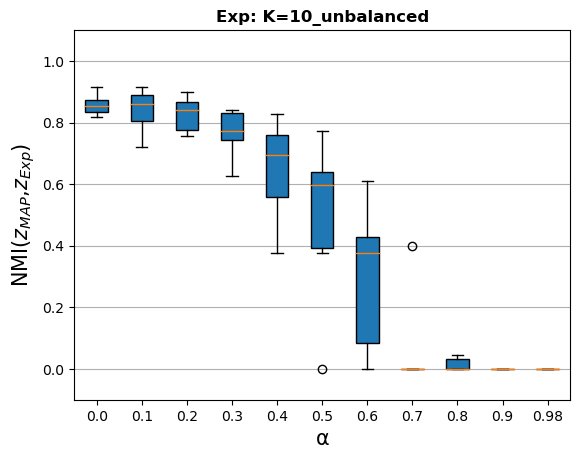

In [12]:
ini_noc = 10
for K in [2,5,10]:
    boxplot_syn_nmi(df=df_sorted, K=K, ini_noc=ini_noc)

#### Single experiment outputs
Using results for data shown in earlier example and initial noc = 30

In [14]:
# choose experiment
dataset = 'synthetic_article'

K = 2
S1 = 5
S2 = 5
Nc_type = 'unbalanced'
alpha = 0
ini_noc = 10

chosen_exp = df_sorted[(df_sorted.noc == ini_noc) & (df_sorted.K==K) & (df_sorted.S1==S1) & (df_sorted.S2==S2) & (df_sorted.Nc_type==Nc_type) & (df_sorted.alpha==alpha)]
exp_name = chosen_exp.exp_name_list.iloc[0][0]

iteration = 100

# extract results
model_sample = np.load(os.path.join(main_dir, 'results/'+dataset+'/'+exp_name+'/model_sample'+str(iteration)+'.npy'), allow_pickle=True).item()
model_sample.keys()

MAP_sample = model_sample['MAP']

iter = MAP_sample['iter']
Z = MAP_sample['Z']
noc = MAP_sample['noc']
logP_A = MAP_sample['logP_A']
logP_Z = MAP_sample['logP_Z']
logP = MAP_sample['logP']
eta = MAP_sample['eta']
#alpha = MAP_sample['alpha']
#eta0 = MAP_sample['eta0']

print('MAP logP(Z|A) =', logP)
print('MAP logP(A|Z) =', logP_A)
print('MAP logP(Z) =', logP_Z)
print('MAP noc =', noc)
#print('MAP alpha =', alpha)
#print('eta0 =', eta0)


MAP logP(Z|A) = -51900.720191076456
MAP logP(A|Z) = -51837.746361896265
MAP logP(Z) = -62.973829180192695
MAP noc = 2


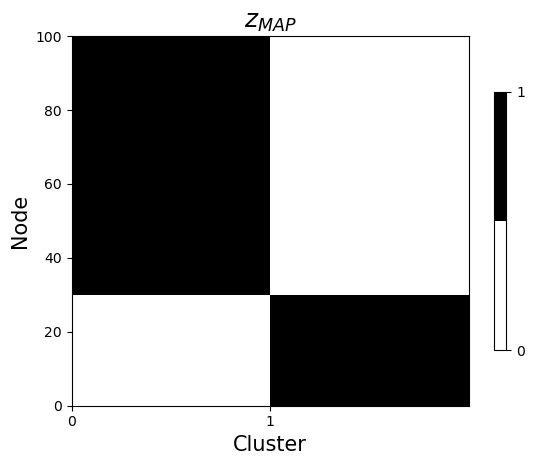

In [15]:
plot_ZMAP(Z,dataset='synthetic_article')

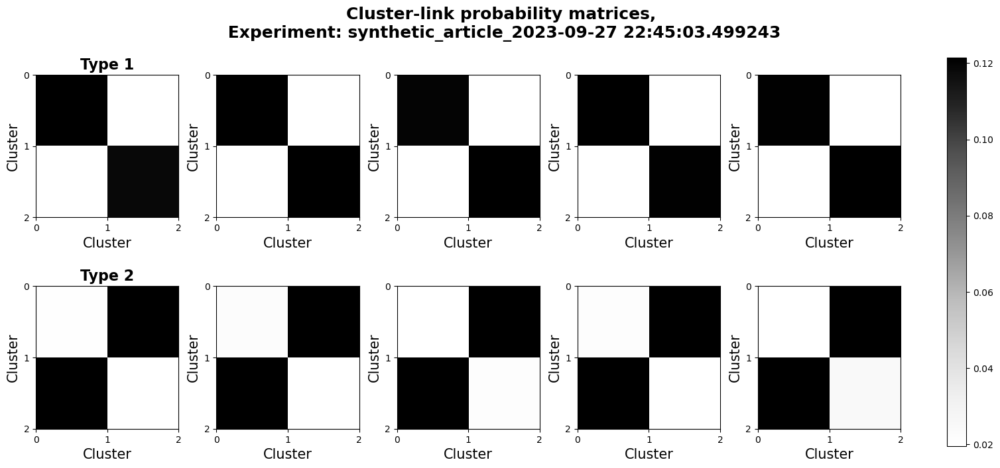

In [16]:
plot_eta(dataset=dataset, eta=eta, exp_name_title=exp_name)

## 2) HCP data


### 2.1) Data visualization
- Example of the integer-weighted graphs: use Glasser atlas like in Frontiers paper

In [17]:
from scipy.sparse import csr_matrix, load_npz, triu 
import nilearn as ni
import nibabel as nib
import seaborn as sns
from nilearn import plotting as nplt
from matplotlib.colors import ListedColormap
from nilearn.maskers import NiftiLabelsMasker

In [18]:
# see get_newgraphs.py (where numpy files with Glasser graph for each subject are computed)

A_dmri_list = []
A_fmri_list = []
for s in range(1,6):
    A_dmri = np.load(os.path.join(main_dir,'data','hcp_article','Glasser_A_dmri_sparse'+str(s)+'.npy'))
    A_fmri = np.load(os.path.join(main_dir,'data','hcp_article','Glasser_A_fmri_sparse'+str(s)+'.npy'))
    A_dmri_log = np.log(1+A_dmri)
    A_fmri_log = np.log(1+A_fmri)
    A_dmri_list.append(A_dmri_log)
    A_fmri_list.append(A_fmri_log)

max_val = np.max([A_dmri_list, A_fmri_list])

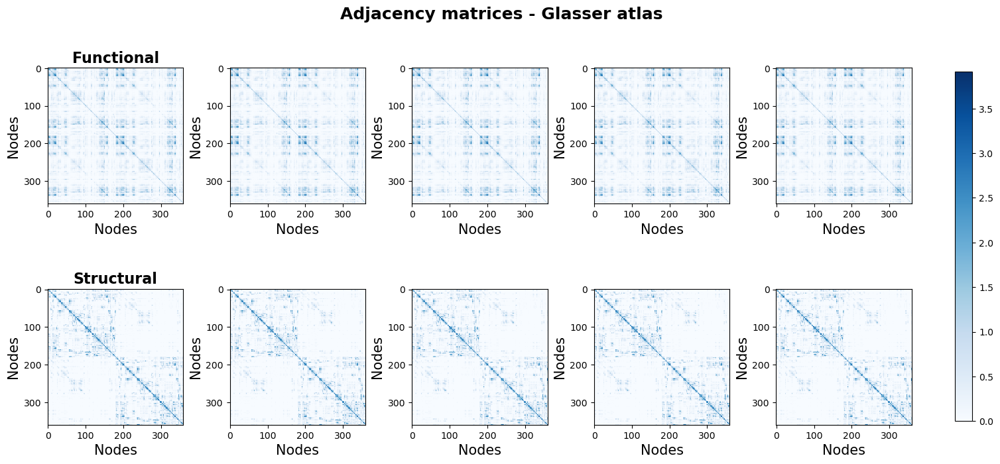

In [19]:
import matplotlib.cm as cm
dpi = 600
shrink = 0.8
cmap = cm.Blues
S1 = len(A_fmri_list)
S2 = len(A_dmri_list)
fig, axs = plt.subplots(2, 5, figsize=(15, 7), constrained_layout=True)
#fig.subplots_adjust(top=0.9)  # Add space between suptitle and subplots
#fig.subplots_adjust(hspace=0.6)  # Add space between the first 5 subplots and the last 5 subplots
axs = axs.ravel()
for s in range(S1+S2):
    if s < S1:
        im = axs[s].imshow(A_fmri_list[s], cmap=cmap, vmax=max_val)
        axs[s].set_ylabel('Nodes', fontsize=label_fontsize)
        axs[s].set_xlabel('Nodes', fontsize=label_fontsize)
        #axs[s].set_xticks([])
        #axs[s].set_yticks([])
    else:
        im = axs[s].imshow(A_dmri_list[s-S1], cmap=cmap, vmax=max_val)
        axs[s].set_ylabel('Nodes', fontsize=label_fontsize)
        axs[s].set_xlabel('Nodes', fontsize=label_fontsize)
        #axs[s].set_xticks([])
        #axs[s].set_yticks([])

axs[0].set_title('Functional', fontsize=subtitle_fontsize, weight='bold')
axs[5].set_title('Structural', fontsize=subtitle_fontsize, weight='bold')    
fig.suptitle('Adjacency matrices - Glasser atlas', fontsize=title_fontsize, weight='bold')
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=shrink)
plt.savefig(os.path.join(main_dir,'figures/article','Glasser_graphs.png'), bbox_inches='tight', dpi=dpi)

### 2.2) Experiments

In [20]:
dataset = 'hcp_article'
top_dir = os.path.join('results', dataset)
main_dir = os.getcwd()
df_exp = get_exp_overview(top_dir)

# sort dataframe
df_sorted = df_exp[df_exp.maxiter_gibbs == 100].sort_values(by='noc').reset_index(drop=True)

In [21]:
df_sorted

,dataset,model_type,splitmerge,noc,maxiter_gibbs,maxiter_eta0,maxiter_alpha,exp_name_list,n_exp
0,hcp_article,parametric,False,1,100,10,100,"[hcp_article_2023-10-18 22:37:23.775955, hcp_a...",10
1,hcp_article,parametric,False,2,100,10,100,"[hcp_article_2023-09-20 04:21:55.735500, hcp_a...",11
2,hcp_article,parametric,False,3,100,10,100,"[hcp_article_2023-09-30 09:26:16.253312, hcp_a...",10
3,hcp_article,parametric,False,4,100,10,100,"[hcp_article_2023-10-23 03:40:20.163752, hcp_a...",10
4,hcp_article,parametric,False,5,100,10,100,"[hcp_article_2023-10-01 04:59:13.278551, hcp_a...",11
5,hcp_article,parametric,False,6,100,10,100,"[hcp_article_2023-10-01 08:26:55.365108, hcp_a...",10
6,hcp_article,parametric,False,7,100,10,100,"[hcp_article_2023-09-18 21:04:17.809889, hcp_a...",10
7,hcp_article,parametric,False,8,100,10,100,"[hcp_article_2023-10-21 01:39:29.452276, hcp_a...",10
8,hcp_article,parametric,False,9,100,10,100,"[hcp_article_2023-10-16 21:51:45.303258, hcp_a...",10
9,hcp_article,parametric,False,10,100,10,100,"[hcp_article_2023-10-27 22:00:35.860580, hcp_a...",11


### 2.3) Results

#### Multiple experiments outputs

##### Log prob. over iterations

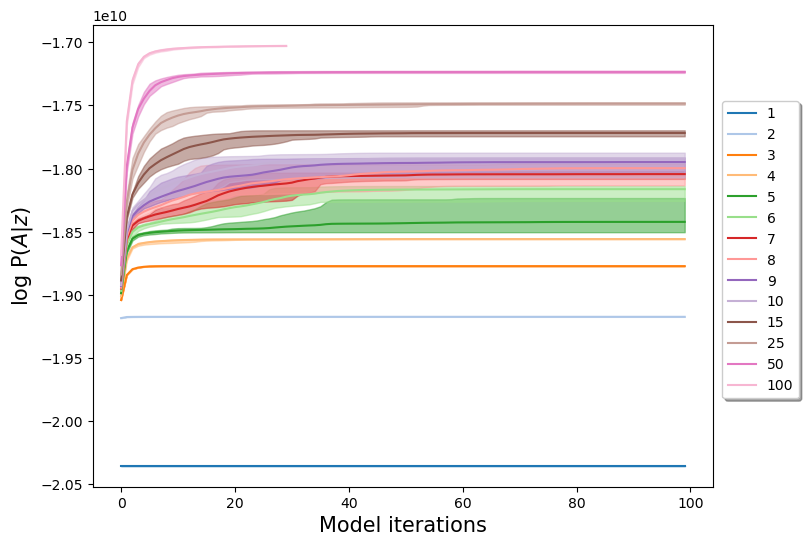

In [22]:
plot_par(dataset=dataset, df=df_sorted, par='logP_A')

In [5]:
#plot_par(dataset=dataset, df=df_sorted, par='logP_Z')

##### MAP log prob. over initial number of clusters

We want to see if there exists an initial noc that maximizes the log likelihood

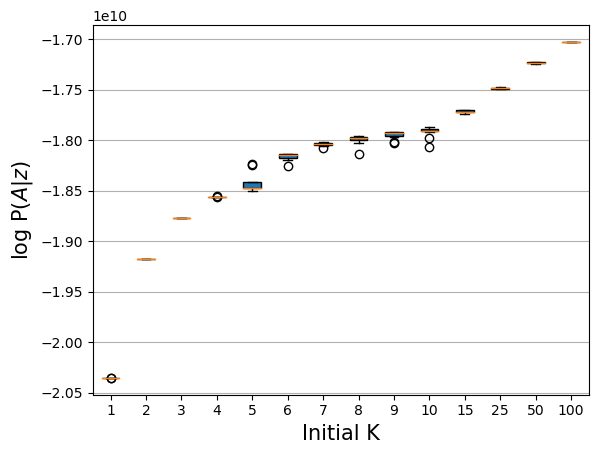

In [23]:
#boxplot_par_over_ininoc(df=df_sorted, par='logP')
boxplot_par_over_ininoc(df=df_sorted, par='logP_A')
#boxplot_par_over_ininoc(df=df_sorted, par='logP_Z')

In [5]:
#plot_par_over_ininoc(df=df_sorted, pars=['logP','logP_A']) # prefer this over the plots above because the x-axis doesn't "jump" from 10-25 and 25-50

##### Mean pairwise NMI between Z's for different initializations over noc 
(e.g. mean([NMI(Z1,Z2),NMI(Z1,Z3),NMI(Z2,Z3)]))


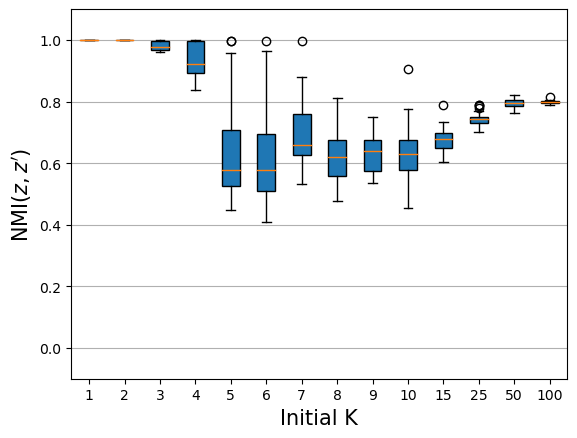

In [24]:
boxplot_par_over_ininoc(df_sorted, par='pairwise_nmi') 

In [8]:
#plot_par_over_ininoc(df=df_sorted, pars=['pairwise_nmi'])

#### Single experiment outputs

In [46]:
# choose experiment
dataset = 'hcp_article'
noc = 2 # 2, 3, 4, 25, 50, 100
exp_folder = get_best_run(df=df_sorted, noc=noc) # experiment visualized is the one with highest MAP estimate across random runs

# extract results
if noc < 100:
    maxiter_gibbs = 100
else: # also including where noc=100 (they only ran 30 iterations)
    maxiter_gibbs = 30
model_sample = np.load(os.path.join(main_dir, 'results/hcp_article/'+exp_folder+'/model_sample'+str(maxiter_gibbs)+'.npy'), allow_pickle=True).item()
model_sample.keys()

MAP_sample = model_sample['MAP']

iter = MAP_sample['iter']
Z = MAP_sample['Z']
noc = MAP_sample['noc']
logP_A = MAP_sample['logP_A']
logP_Z = MAP_sample['logP_Z']
logP = MAP_sample['logP']
eta = MAP_sample['eta']
#alpha = MAP_sample['alpha']
#eta0 = MAP_sample['eta0']

print('MAP logP(Z|A) =', logP)
print('MAP logP(A|Z) =', logP_A)
print('MAP logP(Z) =', logP_Z)
print('MAP noc =', noc)
#print('MAP alpha =', alpha)
#print('eta0 =', eta0)


MAP logP(Z|A) = -19173543780.368385
MAP logP(A|Z) = -19173504128.92938
MAP logP(Z) = -39651.43900824571
MAP noc = 2


##### MAP partition matrix Z

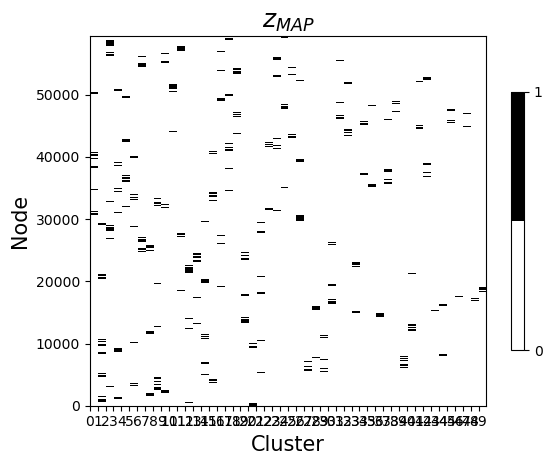

In [34]:
plot_ZMAP(Z, dataset)

##### Glasser graphs permuted wrt. partition

In [44]:
from collections import Counter

def plot_sortedA(A_fmri_list, A_dmri_list, Z, main_dir=main_dir, label_fontsize=label_fontsize, subtitle_fontsize=subtitle_fontsize, title_fontsize=title_fontsize):
    ## find the labels of the all nodes:  partition the labels into N_Glasser "clusters", i.e. Glasser area 1 might include nodelabels 1,1,1,2,2.. then use majority voting to decide the final label of the cluster. 

    # computing node labels using (cluster assignments) from partition
    z = np.argmax(Z, axis=0)+1

    parcels_L = loadmat(os.path.join(main_dir,'data','hcp_article','Glasser_L'))['parcels'].flatten().astype(np.int32)
    parcels_R = loadmat(os.path.join(main_dir,'data','hcp_article','Glasser_R'))['parcels'].flatten().astype(np.int32)
    # NOTICE THAT RIGHT PARCELS ARE SHIFTED, SO WE HAVE 360 UNIQUE LABELS
    parcels = np.append(parcels_L,parcels_R+np.max(parcels_L))
    # compute list of lists with original nodes belonging to respective atlas node (distribution of 59412 nodes into 180 nodes)
    nodes_per_Glabel = [np.where(parcels==label)[0] for label in np.unique(parcels)]

    z_G = np.array([np.bincount(z[nodes_per_Glabel[i]]).argmax() for i in range(len(nodes_per_Glabel))]).astype('int') # majority voting
    
    K = len(np.unique(z_G))
    # Choose a colormap
    cmap = cm.Blues # desired colormap

    # Create colormaps for each graph density type
    colors = ['plum', 'tomato','blueviolet','skyblue', 'teal', 'olivedrab', 'maroon', 'gold', 'royalblue','yellowgreen',
          'orangered', 'chocolate', 'navajowhite', 'darkkhaki','lime','aqua', 'indigo', 'lightgreen', 'magenta', 'mediumslateblue',
          'crimson','navy', 'pink', 'saddlebrown', 'salmon']
  
    if K < 25:
        colors = colors[:K+1]
    elif K == 25:
        colors = colors
    else:
        #print('Error: colors for respective number of clusters are not defined')
        colors = sns.color_palette('hls', K)
    #color_palette = ListedColormap(colors)

    # compute A
    A = np.vstack([A_fmri_list,A_dmri_list]).T
    max_val = np.max(A)

    # sort by based assigned cluster
    sort_idx = np.argsort(z_G)
    A_sorted = A[sort_idx, :, :][:, sort_idx, :]

    # count number nodes in each cluster
    count = Counter(z_G[sort_idx])
    
    A_type1 = A_sorted[:,:,:5] # fmri
    A_type2 = A_sorted[:,:,5:] # dmri

    fig, axs = plt.subplots(2, 5, figsize=(15, 7), constrained_layout=True)
    ticks = [0, 100, 200, 300]
    #fig.subplots_adjust(top=0.9)  # Add space between suptitle and subplots
    #fig.subplots_adjust(hspace=0.6)  # Add space between the first 5 subplots and the last 5 subplots

    axs = axs.ravel()
    for s in range(10):
        if s < 5:
            im = axs[s].imshow(A_type1[:,:,s], cmap=cmap, vmax=max_val)
            #axs[s].set_title('Functional: '+str(s+1), fontsize=subtitle_fontsize, weight='bold')
            #axs[s].set_ylabel('Nodes permuted', fontsize=label_fontsize)
            #axs[s].set_xlabel('Nodes permuted', fontsize=label_fontsize)
            axs[s].grid(False)
            # draw clusters partitions on adjacency matrix
            last_val = -0.5
            for i, x in enumerate(np.cumsum(list(count.values()))):
                size = x - last_val
                axs[s].add_patch(plt.Rectangle((last_val,last_val), size, size, fc=colors[i], ec=colors[i], linewidth=2, fill=False))
                last_val = x
        else:
            im = axs[s].imshow(A_type2[:,:,-(s-4)], cmap=cmap, vmax=max_val)
            #axs[s].set_title('Structural: '+str(s-4), fontsize=subtitle_fontsize, weight='bold')
            #axs[s].set_ylabel('Nodes permuted', fontsize=label_fontsize)
            #axs[s].set_xlabel('Nodes permuted', fontsize=label_fontsize)
            axs[s].grid(False)
            # draw clusters partitions on adjacency matrix
            last_val = -0.5
            for i, x in enumerate(np.cumsum(list(count.values()))):
                size = x - last_val
                axs[s].add_patch(plt.Rectangle((last_val,last_val), size, size, fc=colors[i], ec=colors[i], linewidth=2, fill=False))
                last_val = x
        axs[s].set_xticks(ticks)
        axs[s].set_yticks(ticks)

    axs[0].set_title('Functional', fontsize=subtitle_fontsize, weight='bold')
    axs[5].set_title('Structural', fontsize=subtitle_fontsize, weight='bold')
        
    #fig.suptitle('Sorted adjacency matrices for ' + dataset + ' data for different graph types,\n n_rois='+str(n_rois)+', 6.25th percentile threshold', fontsize=title_fontsize, weight='bold')
    fig.suptitle('Sorted adjacency matrices wrt. partition', fontsize=title_fontsize, weight='bold')
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.9)
    plt.savefig(main_dir+'/figures/article/GlasserA_sorted_'+str(K)+'.png', bbox_inches='tight')
    

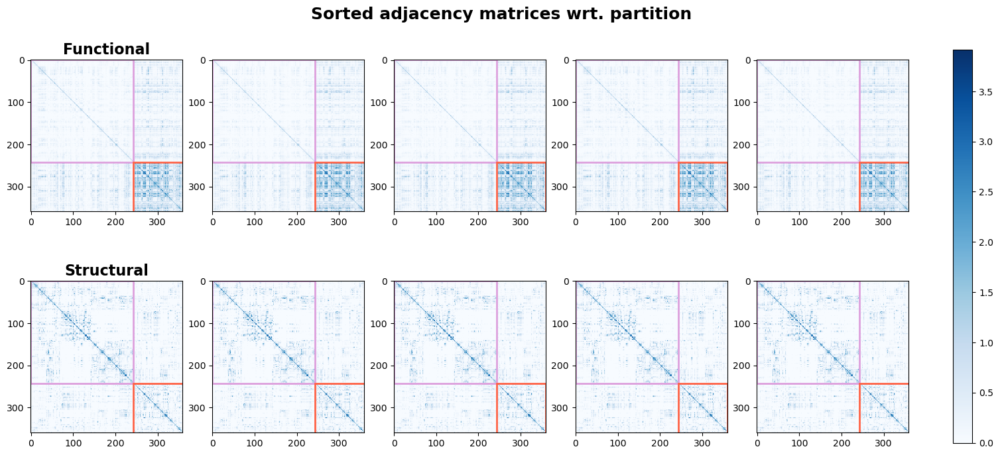

In [47]:
plot_sortedA(A_fmri_list, A_dmri_list, Z)

##### Brain map (according to Z) - from different views

In [81]:
# compute brain map 
import hcp_utils as hcp
from PIL import Image
import nilearn as ni
from nilearn import plotting as nplt

# computing node labels using (cluster assignments) from partition
node_labels = np.argmax(Z, axis=0)+1

#colors = ['gray', 'red', 'green', '#FF1493', '#BCEE68', '#FF6103', '#9932CC', 'brown', 'yellow', 'cyan','blue']
#colors = ['gray', 'yellowgreen', 'plum', 'tomato','blueviolet', 'teal', 'olivedrab', 'maroon', 'gold', 'skyblue','royalblue']
colors = ['gray', 'plum', 'tomato','blueviolet','skyblue', 'teal', 'olivedrab', 'maroon', 'gold', 'royalblue','yellowgreen',
          'orangered', 'chocolate', 'navajowhite', 'darkkhaki','lime','aqua', 'indigo', 'lightgreen', 'magenta', 'mediumslateblue',
          'crimson','navy', 'pink', 'saddlebrown', 'salmon']

if noc < 10:
    colors = colors[:noc+1]
elif noc > 10:
    colors = colors
else: 
    print('Error: colors for respective number of clusters are not defined')
cmap_all = ListedColormap(colors)

#cmap_all = ListedColormap(sns.color_palette('tab10', noc+1))
# INTERACTIVE PLOT
ni.plotting.view_surf(hcp.mesh.pial, 
                           hcp.cortex_data(node_labels), 
                           #bg_map=hcp.mesh.sulc, 
                           threshold=0.1,
                           symmetric_cmap=False,
                           cmap=cmap_all, 
                           colorbar=True)
    
    

In [12]:
# INTERACTIVE plot of a single cluster with respective label from brain map
label = 1
label_color = cmap_all.colors[label]
cmap_single = ListedColormap(sns.color_palette(['gray',label_color])) # custom palette with same color

ni.plotting.view_surf(hcp.mesh.pial, hcp.cortex_data(node_labels==label)*label, bg_map=hcp.mesh.sulc, threshold=0.1, symmetric_cmap=False, cmap=cmap_single, colorbar=False)

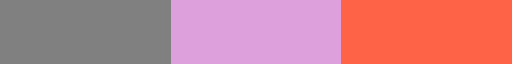

In [13]:
cmap_all

In [82]:
mask_left = np.loadtxt(os.path.join(main_dir,'data','hcp_article','fsLR_32k_cortex-lh_mask.txt'),dtype=bool)
mask_right = np.loadtxt(os.path.join(main_dir,'data','hcp_article','fsLR_32k_cortex-rh_mask.txt'),dtype=bool)

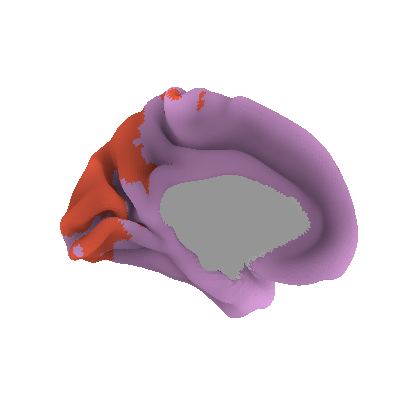

In [104]:
#map_left = np.zeros(mask_left.shape)
#map_left[mask_left] = node_labels[:sum(mask_left)]

view = 'medial'
fig = ni.plotting.plot_surf_roi(hcp.mesh.pial_left, 
                                hcp.left_cortex_data(node_labels[:sum(mask_left)]),
                                bg_map=hcp.mesh.sulc_left, 
                                hemi = 'left',
                                bg_on_data=True,
                                threshold=0.1, 
                                cmap=cmap_all, 
                                colorbar=None,
                                view=view),
                                #output_file='figures/article/brainmap_'+view+'_'+str(noc)+'.png')


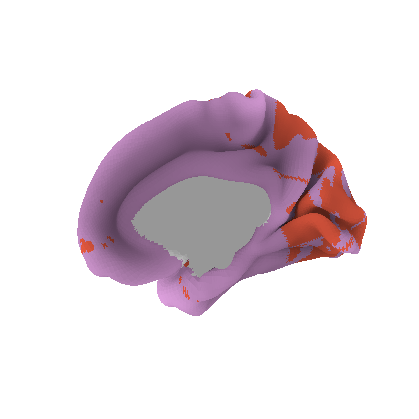

In [106]:
view = 'medial'
fig = ni.plotting.plot_surf_roi(hcp.mesh.pial_right, 
                                hcp.left_cortex_data(node_labels[sum(mask_left):]),
                                bg_map=hcp.mesh.sulc_right, 
                                hemi = 'right',
                                bg_on_data=True,
                                threshold=0.1, 
                                cmap=cmap_all, 
                                colorbar=None,
                                view=view),
                                #output_file='figures/article/brainmap_'+view+'_'+str(noc)+'.png')


In [29]:
GENERATE_NEW_BRAINMAP = False
GENERATE_NEW_BRAINICONS = False

if GENERATE_NEW_BRAINMAP:
    # Compute brain map for different views
    views = ['lateral', 'posterior', 'dorsal']#,'medial']
    for view in views:
        colorbar = False
        #if view == 'dorsal':
            #colorbar = True
        #else:
        #    colorbar = False
        fig = ni.plotting.plot_surf_roi(hcp.mesh.pial, 
                                        hcp.cortex_data(node_labels),
                                        bg_map=hcp.mesh.sulc, 
                                        bg_on_data=True,
                                        threshold=0.1, 
                                        cmap=cmap_all, 
                                        colorbar=colorbar,
                                        view=view,
                                        output_file='figures/article/brainmap_'+view+'_'+str(noc)+'.png')
        
    # Merge brain map view images into one - all labels/clusters shown
    im1 = Image.open('figures/article/brainmap_lateral_'+str(noc)+'.png')
    im2 = Image.open('figures/article/brainmap_posterior_'+str(noc)+'.png')
    im3 = Image.open('figures/article/brainmap_dorsal_'+str(noc)+'.png')
    #im4 = Image.open('figures/article/brainmap_medial_'+str(noc)+'.png')
    crop_shape = (303,250)#(400,300)
    paste_shape = (170,270)#(170,300)
    brainmap_merged = merge_images(im1, im2, im3, crop_shape, paste_shape, merged_im_title='brainmap_merged_'+str(noc)+'.png')
    
if GENERATE_NEW_BRAINICONS:    
    # Create icons for eta circle graph ploto: merge different views of a single cluster and save image
    label_list = np.unique(node_labels)
    views = ['lateral', 'posterior', 'dorsal']
    crop_shape = (303,250)
    paste_shape = (170,270) #paste_shape = (170,250)
    for label in label_list:
        label_color = cmap_all.colors[label]
        cmap_single = ListedColormap(sns.color_palette(['gray',label_color])) # custom palette with same color
        figs = [] # list of figures for different views of respective label
        for view in views:
            fig = ni.plotting.plot_surf_roi(hcp.mesh.pial, 
                                    hcp.cortex_data(node_labels==label)*label, 
                                    bg_map=hcp.mesh.sulc, 
                                    bg_on_data=True,
                                    threshold=0.1, 
                                    cmap=cmap_single,
                                    view=view)#,
                                    #output_file='figures/article/brain_'+view+'_'+str(noc)+'_'+str(label)+'.png')
            figs.append(fig)
        figs[0].canvas.draw()
        figs[1].canvas.draw()
        figs[2].canvas.draw()
        im_lat = Image.frombytes('RGB',figs[0].canvas.get_width_height(),figs[0].canvas.tostring_rgb())
        im_pos = Image.frombytes('RGB',figs[1].canvas.get_width_height(),figs[1].canvas.tostring_rgb())
        im_dor = Image.frombytes('RGB',figs[2].canvas.get_width_height(),figs[2].canvas.tostring_rgb())
        merged_im = merge_images(im_lat, im_pos, im_dor, crop_shape, paste_shape, merged_im_title='brain_merged_'+str(noc)+'_'+str(label)+'.png')
            

##### Cluster-link probability matrices for each graph 

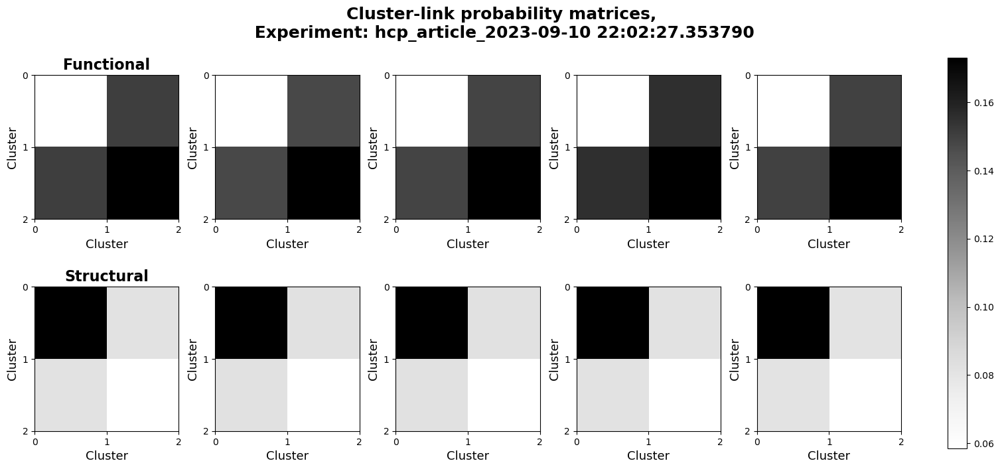

In [16]:
plot_eta(dataset=dataset, eta=eta, exp_name_title=exp_folder)

##### Circular graph plot: Summary statistics for cluster-link probability (mean, std and KL-div)
- over population (both fmri and dmri graphs)
- with-in groups (either fmri and dmri)

In [8]:
#subset_list = ['fmri','dmri']
#for subset in subset_list:
#    plot_eta_metric_matrix(eta=eta, metric='mean', subset=subset)

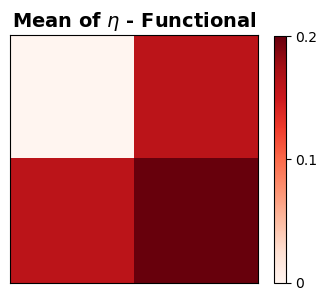

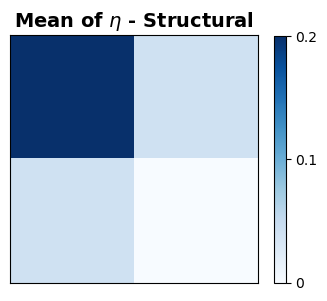

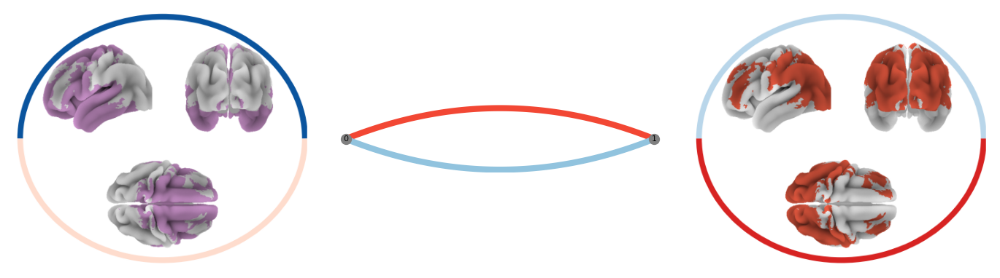

In [12]:
plot_eta_graph(eta)

thesholding links: showing top 1%


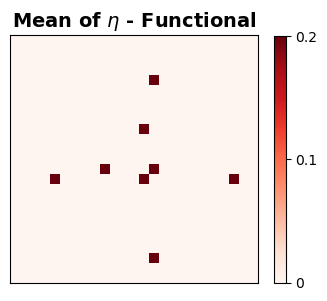

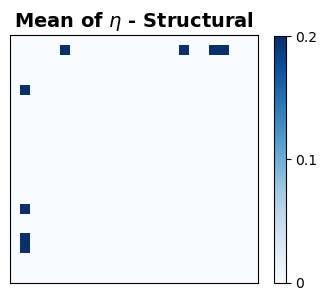

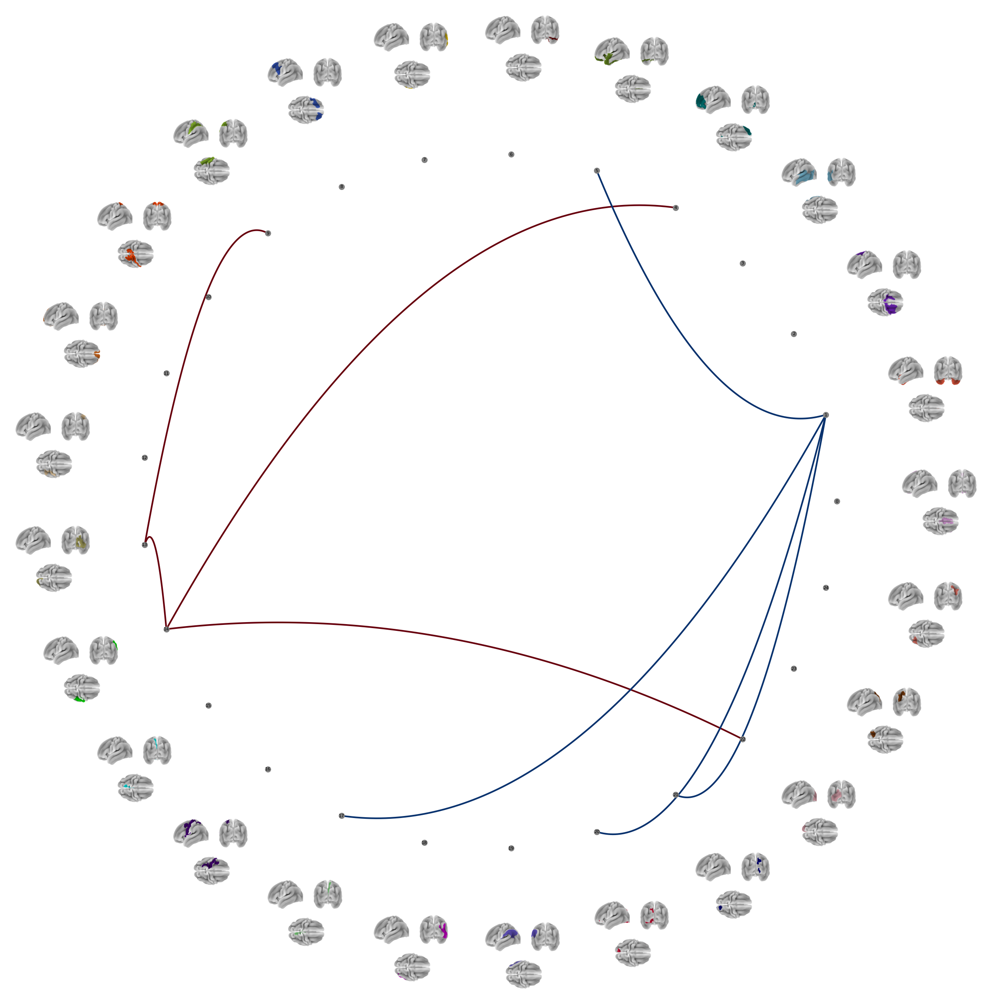

In [6]:
plot_eta_graph(eta,top_links=True)